# Predicting diabetes status using NHANES

[DSLC stages]: Analysis



The following code sets up the libraries and creates cleaned and pre-processed training, validation and test data that we will use in this document.

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

#Libraries imported personally
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import random as rd
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from functions.segment import set_divide
import functions.data_clean_and_preprocess as dcp
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
from joblib import Parallel, delayed

from functions.load_diabetes_data import load_diabetes_data
# load the diabetes data
diabetes = load_diabetes_data()

pd.set_option('display.max_columns', None)

D:\Anacoda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


In [2]:
diabetes.head()

,house_family_person_id,diabetes,age,smoker,sex,coronary_heart_disease,weight,bmi,height,hypertension,heart_condition,cancer,family_history_diabetes
0,1_2_1,0,24,2,2,0,125,2019,66,0,0,0,0
1,2_1_1,0,76,2,1,0,190,2727,70,1,0,0,0
2,3_1_2,0,36,2,2,0,225,3862,64,0,0,0,1
3,5_1_1,0,35,1,2,0,240,3995,65,0,0,0,1
4,10_1_5,0,20,2,2,0,103,1883,62,0,0,0,1



Fill in this document to complete the diabetes prediction exercise.

In [3]:
dbt_train, dbt_val, dbt_test = set_divide(diabetes.copy())

In [4]:
dbt_train_bost = [dbt_train.sample(frac=1, replace=True) for i in range(100)]
dbt_train_bost_std = []
for i in range(100):
    dbt_train_bost_std.append(dcp.data_clean_and_preprocess_perturb(dbt_train_bost[i], False, False, False, False, True))
    dbt_train_bost[i] = dcp.data_clean_and_preprocess_default(dbt_train_bost[i])

In [5]:
dbt_train_ptb = []
dbt_val_ptb = []
dbt_test_ptb = []

dbt_train_ptb_label = []
dbt_val_ptb_label = []
dbt_test_ptb_label = []

for i in [False,True]:
    for j in [False,True]:
        for k in [False,True]:
            for l in [False,True]:
                for m in [False,True]:
                    dbt_train_i = dcp.data_clean_and_preprocess_perturb(dbt_train.copy(), i, j, k, l, m)
                    dbt_val_i = dcp.data_clean_and_preprocess_perturb(dbt_val.copy(), i, j, k, l, m)
                    dbt_test_i = dcp.data_clean_and_preprocess_perturb(dbt_test.copy(), i, j, k, l, m)
                    
                    dbt_train_ptb_label.append(dbt_train_i["diabetes"])
                    dbt_val_ptb_label.append(dbt_val_i["diabetes"])
                    dbt_test_ptb_label.append(dbt_test_i["diabetes"])
                    dbt_train_ptb.append(dbt_train_i.drop(columns = ["house_family_person_id","diabetes"]))
                    dbt_val_ptb.append(dbt_val_i.drop(columns = ["house_family_person_id","diabetes"]))
                    dbt_test_ptb.append(dbt_test_i.drop(columns = ["house_family_person_id","diabetes"]))

In [6]:
dbt_train = dcp.data_clean_and_preprocess_default(dbt_train)
dbt_val = dcp.data_clean_and_preprocess_default(dbt_val)
dbt_test = dcp.data_clean_and_preprocess_default(dbt_test)

In [7]:
dbt_train_label = dbt_train["diabetes"]
dbt_val_label = dbt_val["diabetes"]
dbt_test_label = dbt_test["diabetes"]
dbt_train = dbt_train.drop(columns = ["house_family_person_id","diabetes"])
dbt_val = dbt_val.drop(columns = ["house_family_person_id","diabetes"])
dbt_test = dbt_test.drop(columns = ["house_family_person_id","diabetes"])

In [8]:
dbt_train_bost_label = []
for i in range(100):
    dbt_train_bost_label.append(dbt_train_bost[i]["diabetes"])
    dbt_train_bost[i] = dbt_train_bost[i].drop(columns = ["house_family_person_id","diabetes"])
    dbt_train_bost_std[i] = dbt_train_bost_std[i].drop(columns = ["house_family_person_id","diabetes"])

*************************************************************************************************************************************************

The following parts are for the LS algorithm.

*************************************************************************************************************************************************

In [9]:
LS = LinearRegression()
LS.fit(dbt_train, dbt_train_label)

LinearRegression()

In [10]:
threshold_ls = 0
acc = 0

for i in [float(i)/100 for i in range(0,101)]:
    if accuracy_score(dbt_val_label, LS.predict(dbt_val) > i) > acc:
        acc = accuracy_score(dbt_val_label, LS.predict(dbt_val) > i)
        threshold_ls = i

In [11]:
acc_ls = accuracy_score(dbt_val_label, LS.predict(dbt_val) > threshold_ls)
acc_ls

0.9093782929399368

In [12]:
rmse_ls = np.sqrt(np.mean((dbt_val_label - (LS.predict(dbt_val) > threshold_ls))**2))
rmse_ls

0.30103439514458014

In [13]:
cfm_ls = confusion_matrix(dbt_val_label, (LS.predict(dbt_val) > threshold_ls))
cfm_ls

array([[5101,   54],
       [ 462,   77]], dtype=int64)

In [14]:
tpr_ls = cfm_ls[1,1]/(cfm_ls[1,1]+cfm_ls[1,0])
tnr_ls = cfm_ls[0,0]/(cfm_ls[0,0]+cfm_ls[0,1])
tpr_ls, tnr_ls

(0.14285714285714285, 0.9895247332686712)

Text(0.5, 1.0, 'ROC curve for LS algorithm')

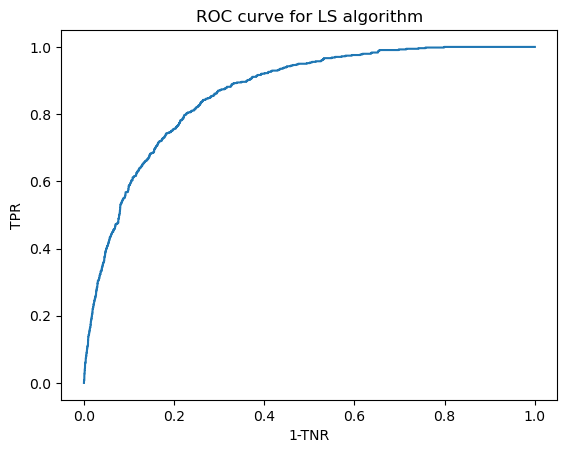

In [15]:
roc_ls = roc_curve(dbt_val_label, LS.predict(dbt_val))
plt.plot(roc_ls[0], roc_ls[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curve for LS algorithm")

In [16]:
auc_ls = roc_auc_score(dbt_val_label, LS.predict(dbt_val))
auc_ls

0.8649262473704763

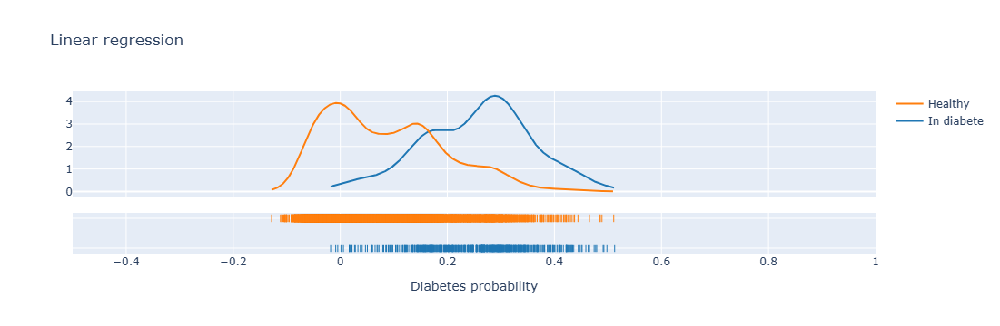

In [17]:
# create overlaid density plots comparing the predicted probabilities for those who did and did not make a purchase in the validation set
ls_dnp = pd.DataFrame(dict(diabetes = dbt_val_label, ls_pred = LS.predict(dbt_val)))
ls_dnp['diabetes'] = ls_dnp['diabetes'].astype('category')
fig = ff.create_distplot([ls_dnp[ls_dnp.diabetes == 1]['ls_pred'], ls_dnp[ls_dnp.diabetes == 0]['ls_pred']], 
                   show_hist=False, group_labels=['In diabete', 'Healthy'])  # specify the range of the plot
fig.update_xaxes(title_text='Diabetes probability', range=[-0.5, 1])
fig.update_layout(title_text = "Linear regression")

D:\Anacoda\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



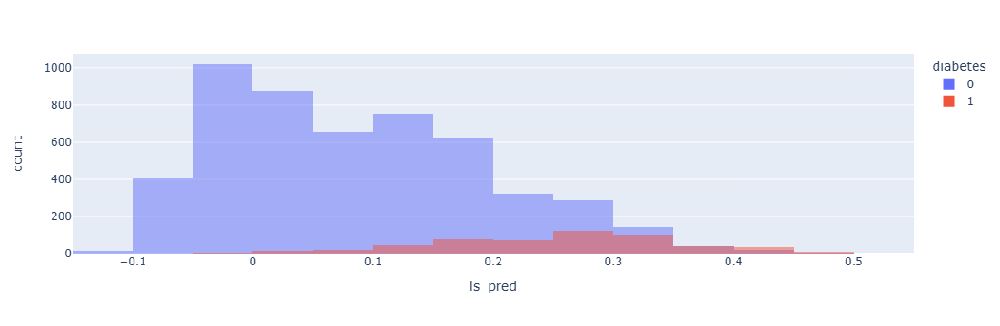

In [18]:
px.histogram(ls_dnp, x='ls_pred', color='diabetes', 
             nbins=20, opacity=0.5, 
             barmode='overlay')

In [19]:
LS_bost = [LinearRegression().fit(dbt_train_bost[i],dbt_train_bost_label[i]) for i in range(100)]

In [20]:
LS_bost_pred = [model.predict(dbt_val) for model in LS_bost]

Text(0.5, 1.0, 'ROC curves for LS algorithm in bootstrap')

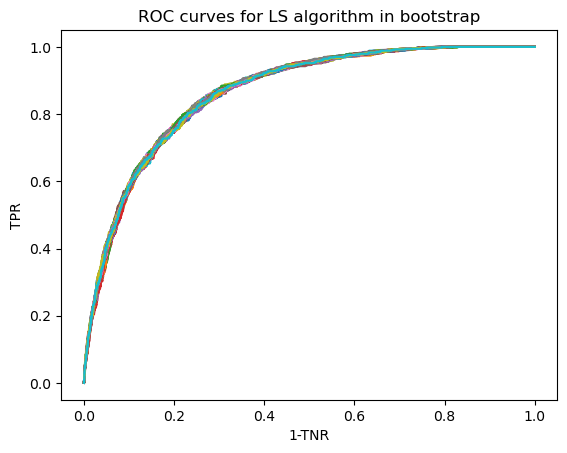

In [21]:
for i in range(100):
    roc_ls_bost = roc_curve(dbt_val_label, LS_bost_pred[i])
    plt.plot(roc_ls_bost[0], roc_ls_bost[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for LS algorithm in bootstrap")

In [22]:
tpr_bost_ls = [metrics.recall_score(dbt_val_label, pred>threshold_ls) for pred in LS_bost_pred]
acc_bost_ls = [metrics.accuracy_score(dbt_val_label, pred>threshold_ls) for pred in LS_bost_pred]
tnr_bost_ls = [metrics.recall_score(dbt_val_label, pred>threshold_ls, pos_label=0) for pred in LS_bost_pred]

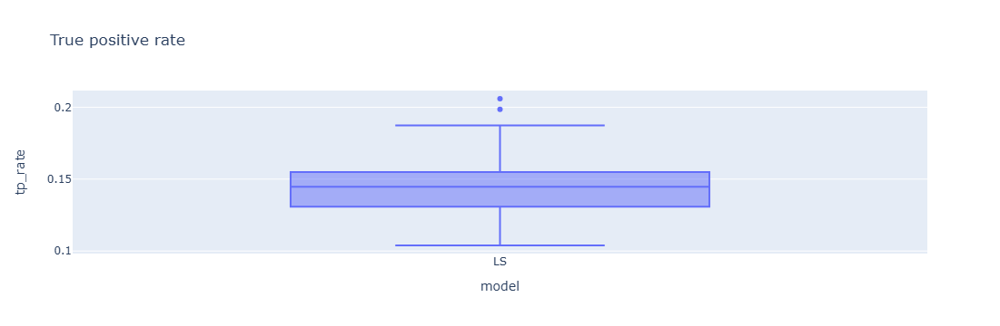

In [23]:
ls_tp_df = pd.DataFrame(dict(tp_rate = tpr_bost_ls ,model = 'LS'))
px.box(pd.concat([ls_tp_df]), x='model', y='tp_rate', title='True positive rate')

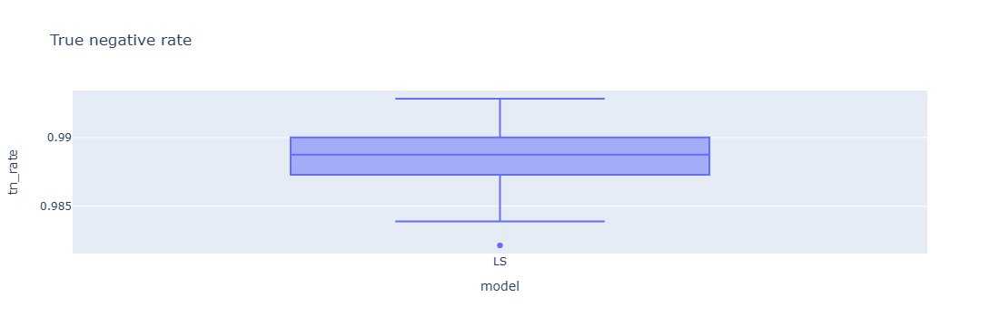

In [24]:
ls_tn_df = pd.DataFrame(dict(tn_rate = tnr_bost_ls, model = 'LS'))
px.box(pd.concat([ls_tn_df]), x='model', y='tn_rate', title='True negative rate')

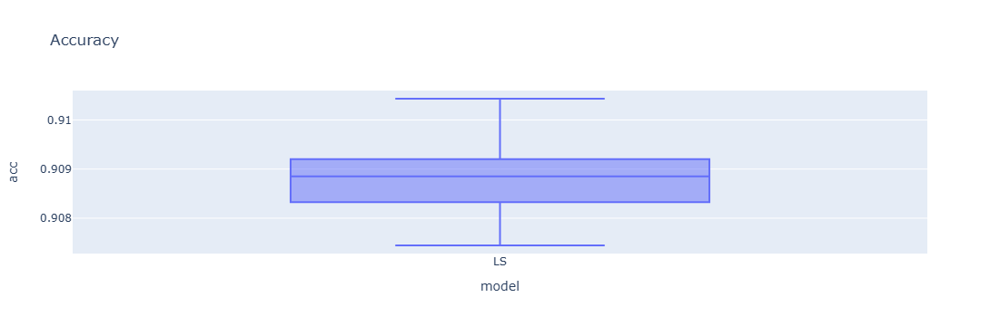

In [25]:
ls_acc_df = pd.DataFrame(dict(acc = acc_bost_ls, model = 'LS'))
px.box(pd.concat([ls_acc_df]), x='model', y='acc', title='Accuracy')

In [26]:
LS_bost_std = [LinearRegression().fit(dbt_train_bost_std[i],dbt_train_bost_label[i]) for i in range(100)]

In [27]:
LS_bost_cof_std = pd.DataFrame([x.coef_ for x in LS_bost_std])
LS_bost_cof_std.columns = dbt_train_bost_std[0].columns
LS_bost_cof_std.head()

,age,smoker,sex,coronary_heart_disease,weight,height,hypertension,heart_condition,cancer,family_history_diabetes
0,0.030491,-0.002451,0.000116,0.098602,0.045419,-0.021950,0.111795,0.028729,0.029873,0.107142
1,0.034822,0.003334,-0.011718,0.133848,0.044187,-0.027782,0.113850,0.029827,0.002724,0.105147
2,0.029031,0.001538,0.001236,0.117208,0.038451,-0.018671,0.111959,0.024951,0.020171,0.114043
3,0.030426,0.010448,-0.013213,0.102703,0.043031,-0.028000,0.117747,0.039652,0.022273,0.109738
4,0.030026,-0.002118,-0.011693,0.138905,0.038602,-0.022491,0.121981,0.029256,0.021477,0.110208


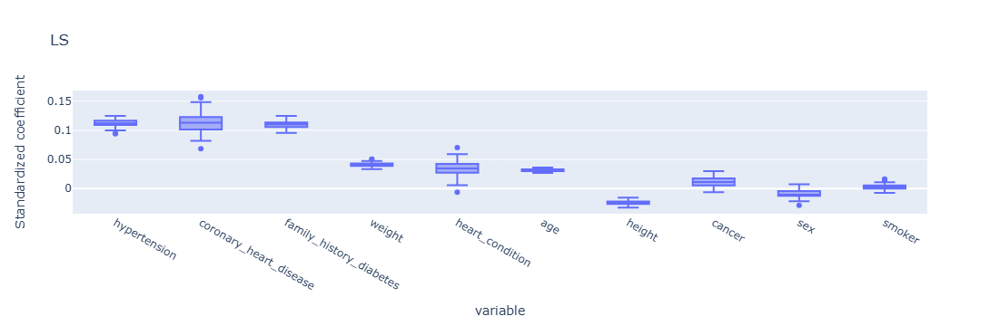

In [28]:
# Sort the columns based on the absolute values of the coefficients
sorted_columns = LS_bost_cof_std.abs() \
    .mean() \
    .sort_values(ascending=False) \
    .head(20) \
    .index

# Create the boxplot with the sorted columns
fig = px.box(LS_bost_cof_std[sorted_columns],
             title='LS')
fig.update_yaxes(title_text='Standardized coefficient')

In [29]:
LS_ptb = []

for i in range(32):
    LS_ptb_i = LinearRegression().fit(dbt_train_ptb[i],dbt_train_ptb_label[i])
    LS_ptb_probs = LS_ptb_i.predict(dbt_val_ptb[i])

    LS_ptb.append([LS_ptb_i, LS_ptb_probs])

Text(0.5, 1.0, 'ROC curves for LS algorithm in perturbations')

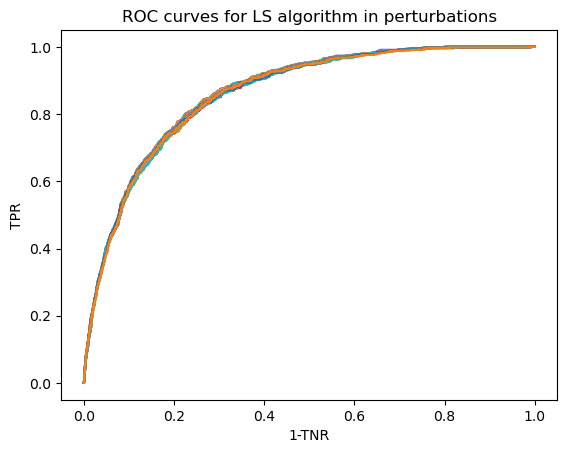

In [30]:
for i in range(32):
    roc_ls_ptb = roc_curve(dbt_val_ptb_label[i], LS_ptb[i][1])
    plt.plot(roc_ls_ptb[0], roc_ls_ptb[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for LS algorithm in perturbations")

In [31]:
tpr_ptb_ls = [metrics.recall_score(dbt_val_ptb_label[i], LS_ptb[i][1]>threshold_ls) for i in range(32)]
acc_ptb_ls = [metrics.accuracy_score(dbt_val_ptb_label[i], LS_ptb[i][1]>threshold_ls) for i in range(32)]
tnr_ptb_ls = [metrics.recall_score(dbt_val_ptb_label[i], LS_ptb[i][1]>threshold_ls, pos_label=0) for i in range(32)]

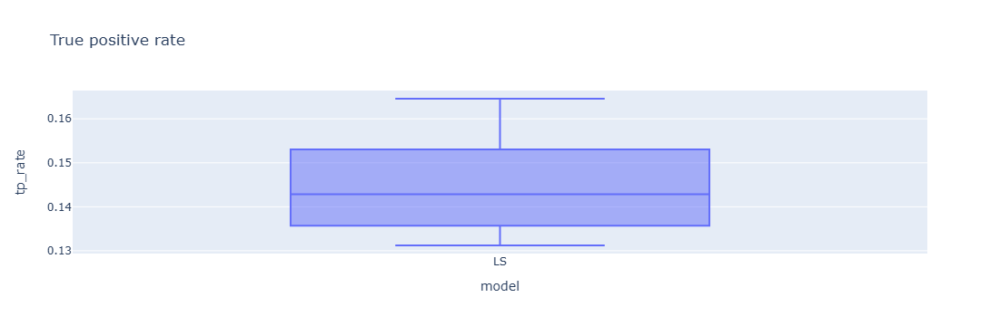

In [32]:
ls_tp_ptb = pd.DataFrame(dict(tp_rate = tpr_ptb_ls ,model = 'LS'))
px.box(pd.concat([ls_tp_ptb]), x='model', y='tp_rate', title='True positive rate')

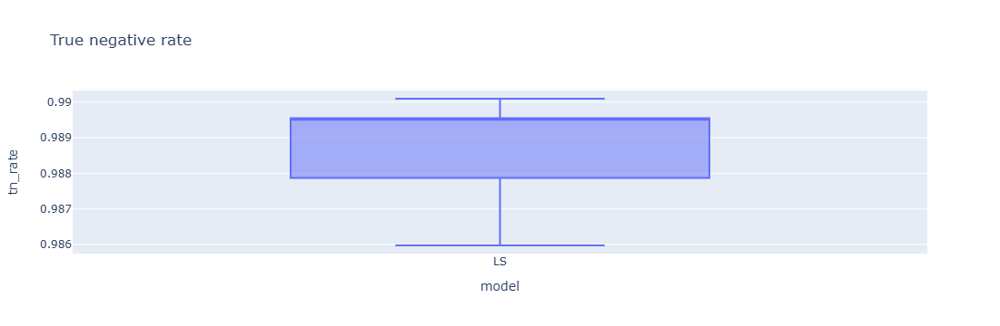

In [33]:
ls_tn_ptb = pd.DataFrame(dict(tn_rate = tnr_ptb_ls, model = 'LS'))
px.box(pd.concat([ls_tn_ptb]), x='model', y='tn_rate', title='True negative rate')

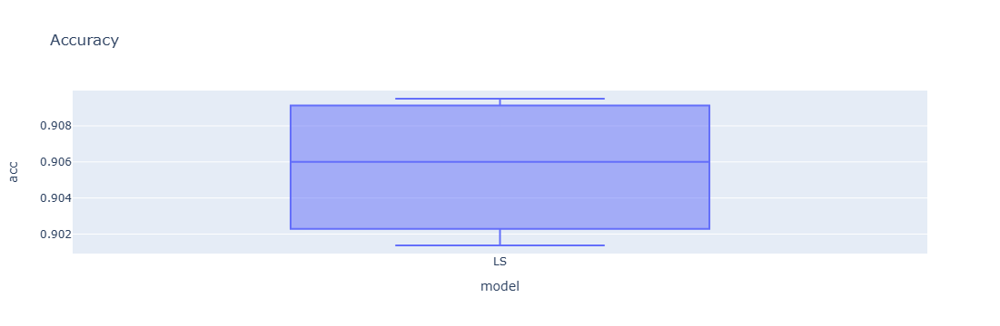

In [34]:
ls_acc_ptb = pd.DataFrame(dict(acc = acc_ptb_ls, model = 'LS'))
px.box(pd.concat([ls_acc_ptb]), x='model', y='acc', title='Accuracy')

*************************************************************************************************************************************************

The following parts are for the LOG algorithm.

*************************************************************************************************************************************************

In [35]:
LOG = LogisticRegression()
LOG.fit(dbt_train, dbt_train_label)

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [36]:
acc = accuracy_score(dbt_val_label, LOG.predict(dbt_val))
acc

0.9099051633298209

In [37]:
acc_log = accuracy_score(dbt_val_label, LOG.predict(dbt_val))
acc_log

0.9099051633298209

In [38]:
rmse_log = np.sqrt(np.mean((dbt_val_label - (LOG.predict(dbt_val)))**2))
rmse_log

0.3001580195000279

In [39]:
cfm_log = confusion_matrix(dbt_val_label, (LOG.predict(dbt_val)))
cfm_log

array([[5098,   57],
       [ 456,   83]], dtype=int64)

In [40]:
tpr_log = cfm_log[1,1]/(cfm_log[1,0]+cfm_log[1,1])
tnr_log = cfm_log[0,0]/(cfm_log[0,0]+cfm_log[0,1])
tpr_log, tnr_log

(0.15398886827458255, 0.9889427740058196)

Text(0.5, 1.0, 'ROC curve for LOG algorithm')

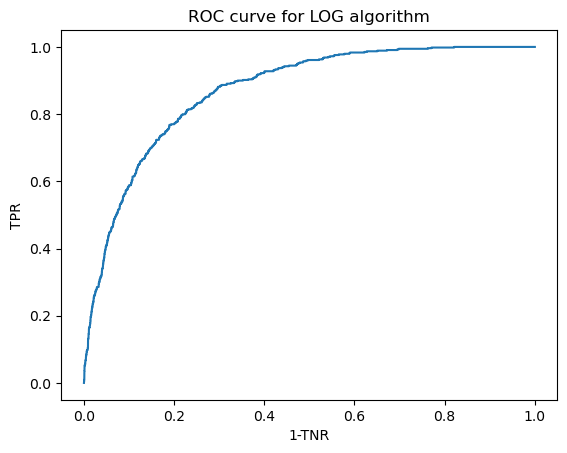

In [41]:
roc_log = roc_curve(dbt_val_label, LOG.predict_proba(dbt_val)[:,1])
plt.plot(roc_log[0], roc_log[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curve for LOG algorithm")

In [42]:
auc_log = roc_auc_score(dbt_val_label, LOG.predict_proba(dbt_val)[:,1])
auc_log

0.8694501978553525

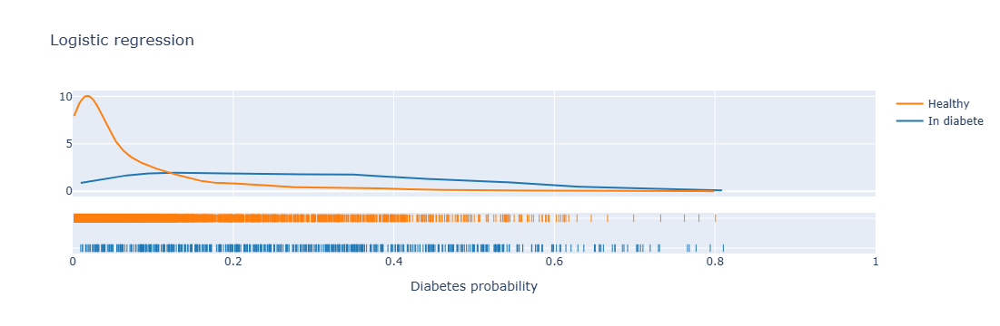

In [43]:
log_dnp = pd.DataFrame(dict(diabetes = dbt_val_label, log_pred = LOG.predict_proba(dbt_val)[:,1]))
log_dnp['diabetes'] = log_dnp['diabetes'].astype('category')
fig = ff.create_distplot([log_dnp[log_dnp.diabetes == 1]['log_pred'], log_dnp[log_dnp.diabetes == 0]['log_pred']], 
                   show_hist=False, group_labels=['In diabete', 'Healthy'])  # specify the range of the plot
fig.update_xaxes(title_text='Diabetes probability', range=[0, 1])
fig.update_layout(title_text = "Logistic regression")

D:\Anacoda\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



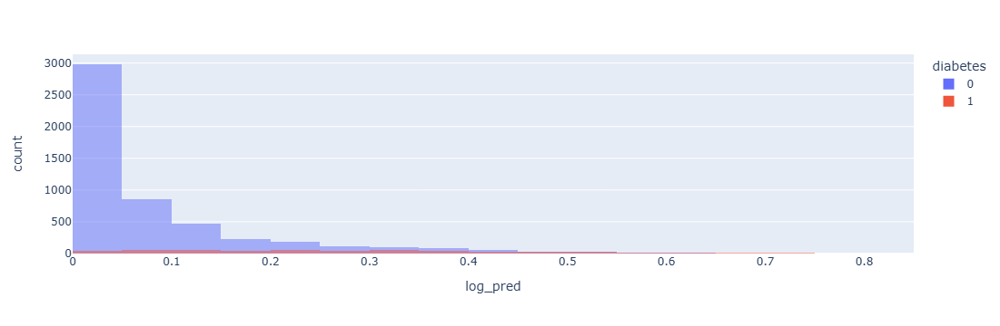

In [44]:
px.histogram(log_dnp, x='log_pred', color='diabetes', 
             nbins=20, opacity=0.5, 
             barmode='overlay')

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: Co

Text(0.5, 1.0, 'ROC curves for LOG algorithm in bootstrap')

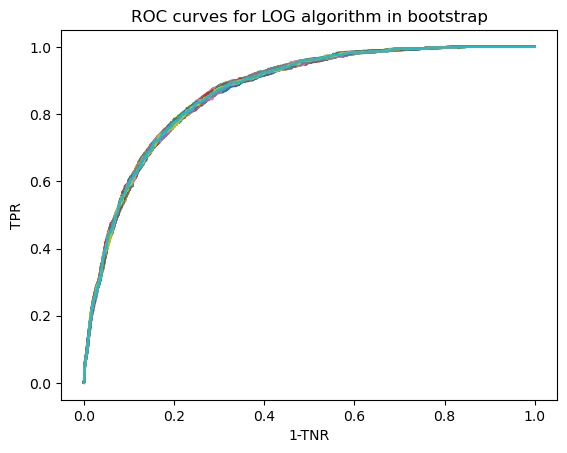

In [45]:
LOG_bost = [LogisticRegression().fit(dbt_train_bost[i],dbt_train_bost_label[i]) for i in range(100)]
LOG_bost_pred = [model.predict(dbt_val) for model in LOG_bost]
for i in range(100):
    roc_log_bost = roc_curve(dbt_val_label, LOG_bost[i].predict_proba(dbt_val)[:,1])
    plt.plot(roc_log_bost[0], roc_log_bost[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for LOG algorithm in bootstrap")

In [46]:
tpr_bost_log = [metrics.recall_score(dbt_val_label, pred) for pred in LOG_bost_pred]
acc_bost_log = [metrics.accuracy_score(dbt_val_label, pred) for pred in LOG_bost_pred]
tnr_bost_log = [metrics.recall_score(dbt_val_label, pred, pos_label=0) for pred in LOG_bost_pred]

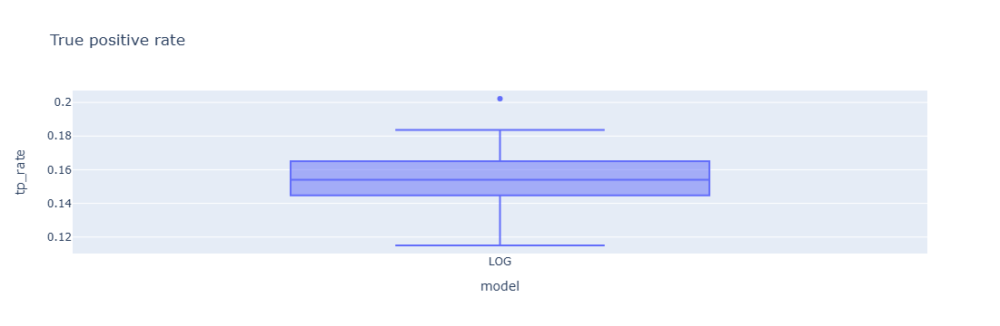

In [47]:
log_tp_df = pd.DataFrame(dict(tp_rate = tpr_bost_log ,model = 'LOG'))
px.box(pd.concat([log_tp_df]), x='model', y='tp_rate', title='True positive rate')

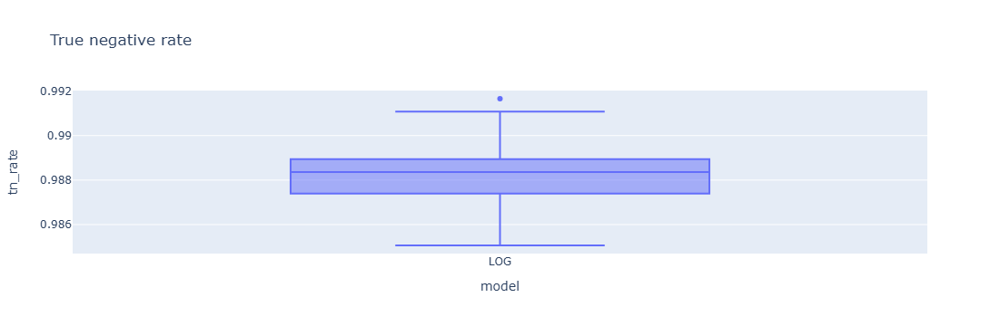

In [48]:
log_tn_df = pd.DataFrame(dict(tn_rate = tnr_bost_log, model = 'LOG'))
px.box(pd.concat([log_tn_df]), x='model', y='tn_rate', title='True negative rate')

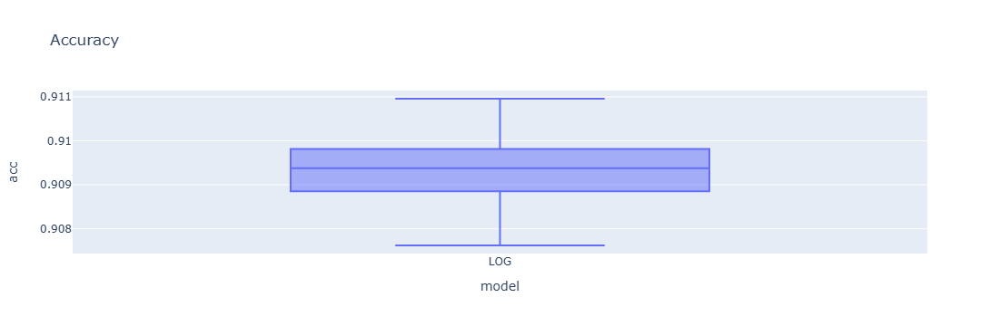

In [49]:
log_acc_df = pd.DataFrame(dict(acc = acc_bost_log, model = 'LOG'))
px.box(pd.concat([log_acc_df]), x='model', y='acc', title='Accuracy')

In [50]:
LOG_bost_std = [LogisticRegression().fit(dbt_train_bost_std[i],dbt_train_bost_label[i]) for i in range(100)]
LOG_bost_cof_std = pd.DataFrame([x.coef_[0] for x in LOG_bost_std])
LOG_bost_cof_std.columns = dbt_train_bost_std[0].columns
LOG_bost_cof_std.head()

,age,smoker,sex,coronary_heart_disease,weight,height,hypertension,heart_condition,cancer,family_history_diabetes
0,0.657784,-0.109293,-0.013387,0.493953,0.601417,-0.266580,1.150656,0.139404,0.219646,1.300315
1,0.696418,-0.075580,-0.209538,0.613636,0.584477,-0.349798,1.156011,0.187747,-0.002717,1.248163
2,0.607898,-0.094219,-0.024702,0.603072,0.503762,-0.233523,1.150366,0.132001,0.147944,1.358095
3,0.630730,0.000032,-0.209795,0.471961,0.556669,-0.357227,1.203234,0.255250,0.141698,1.284732
4,0.643813,-0.109006,-0.182126,0.664145,0.534407,-0.293038,1.226844,0.190743,0.130178,1.309078


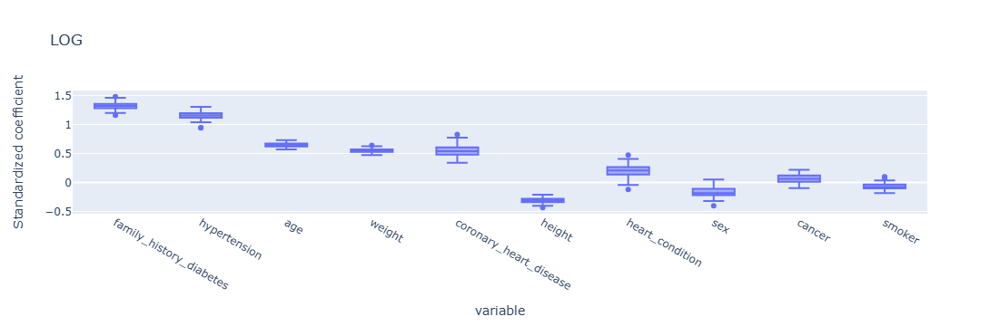

In [51]:
# Sort the columns based on the absolute values of the coefficients
sorted_columns = LOG_bost_cof_std.abs() \
    .mean() \
    .sort_values(ascending=False) \
    .head(20) \
    .index

# Create the boxplot with the sorted columns
fig = px.box(LOG_bost_cof_std[sorted_columns],
             title='LOG')
fig.update_yaxes(title_text='Standardized coefficient')

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

D:\Anacoda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: Co

Text(0.5, 1.0, 'ROC curves for LOG algorithm in perturbations')

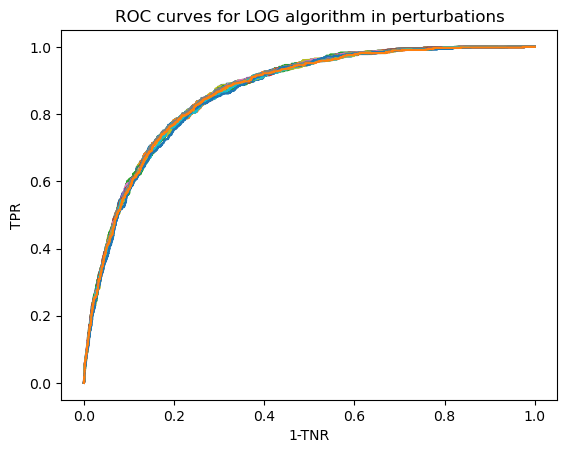

In [52]:
LOG_ptb = []

for i in range(32):
    LOG_ptb_i = LogisticRegression().fit(dbt_train_ptb[i],dbt_train_ptb_label[i])
    LOG_ptb_probs = LOG_ptb_i.predict(dbt_val_ptb[i])

    LOG_ptb.append([LOG_ptb_i, LOG_ptb_probs])

for i in range(32):
    roc_log_ptb = roc_curve(dbt_val_ptb_label[i], LOG_ptb[i][0].predict_proba(dbt_val_ptb[i])[:,1])
    plt.plot(roc_log_ptb[0], roc_log_ptb[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for LOG algorithm in perturbations")

In [53]:
tpr_ptb_log = [metrics.recall_score(dbt_val_ptb_label[i], LOG_ptb[i][1]) for i in range(32)]
acc_ptb_log = [metrics.accuracy_score(dbt_val_ptb_label[i], LOG_ptb[i][1]) for i in range(32)]
tnr_ptb_log = [metrics.recall_score(dbt_val_ptb_label[i], LOG_ptb[i][1], pos_label=0) for i in range(32)]

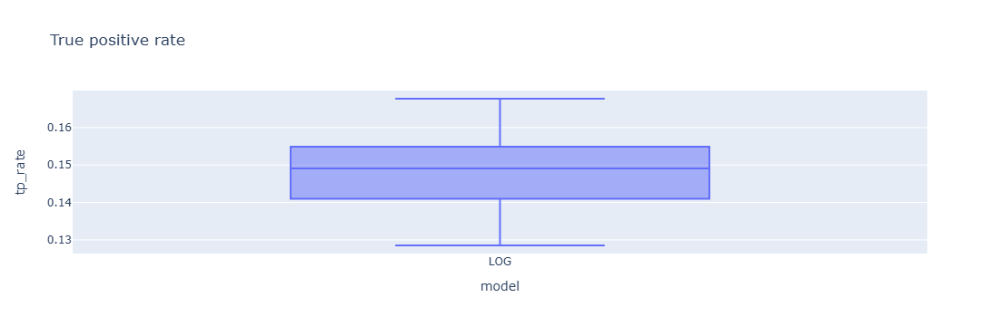

In [54]:
log_tp_ptb = pd.DataFrame(dict(tp_rate = tpr_ptb_log ,model = 'LOG'))
px.box(pd.concat([log_tp_ptb]), x='model', y='tp_rate', title='True positive rate')

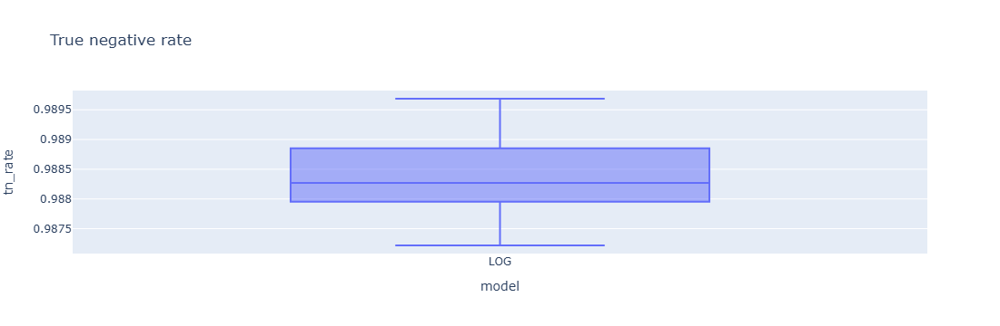

In [55]:
log_tn_ptb = pd.DataFrame(dict(tn_rate = tnr_ptb_log, model = 'LOG'))
px.box(pd.concat([log_tn_ptb]), x='model', y='tn_rate', title='True negative rate')

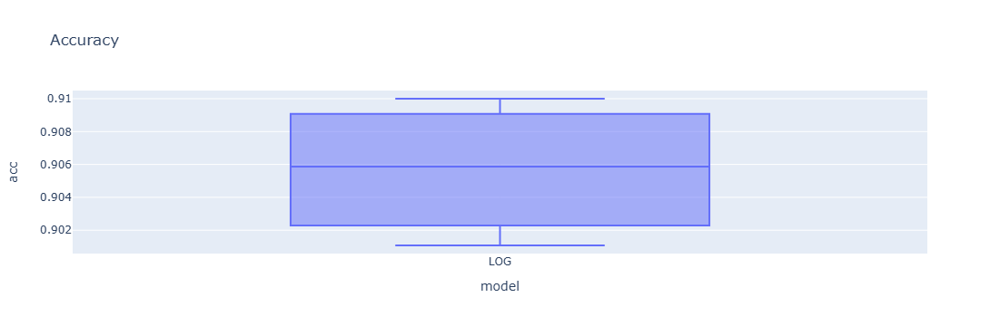

In [56]:
log_acc_ptb = pd.DataFrame(dict(acc = acc_ptb_log, model = 'LOG'))
px.box(pd.concat([log_acc_ptb]), x='model', y='acc', title='Accuracy')

*************************************************************************************************************************************************

The following parts are for the CART algorithm.

*************************************************************************************************************************************************

In [57]:
acc = 0
comb = [0,0,0]

for j in [None,2,3,4,5,6,7,8]:
    for k in [2,3,5,8,10,20]:
        CART = DecisionTreeRegressor(max_depth = j, min_samples_split = k)
        CART.fit(dbt_train, dbt_train_label)
        
        for i in [float(i)/100 for i in range(0,101)]:
            if accuracy_score(dbt_val_label, CART.predict(dbt_val) > i) > acc:
                acc = accuracy_score(dbt_val_label, CART.predict(dbt_val) > i)
                comb = [i,j,k]

In [58]:
depth = comb[1]
min_sam = comb[2]
threshold_cart = comb[0]

CART = DecisionTreeRegressor(max_depth = depth, min_samples_split = min_sam)
CART.fit(dbt_train, dbt_train_label)

DecisionTreeRegressor(max_depth=8, min_samples_split=5)

In [59]:
acc_cart = accuracy_score(dbt_val_label, CART.predict(dbt_val) > threshold_cart)
acc_cart

0.9067439409905164

In [60]:
rmse_cart = np.sqrt(np.mean((dbt_val_label - (CART.predict(dbt_val) > threshold_cart))**2))
rmse_cart

0.3053785503428223

In [61]:
cfm_cart = confusion_matrix(dbt_val_label, CART.predict(dbt_val) > threshold_cart)
cfm_cart

array([[5129,   26],
       [ 505,   34]], dtype=int64)

In [62]:
tpr_cart = cfm_cart[1,1]/(cfm_cart[1,0]+cfm_cart[1,1])
tnr_cart = cfm_cart[0,0]/(cfm_cart[0,0]+cfm_cart[0,1])
tpr_cart, tnr_cart

(0.06307977736549165, 0.9949563530552862)

Text(0.5, 1.0, 'ROC curve for CART algorithm')

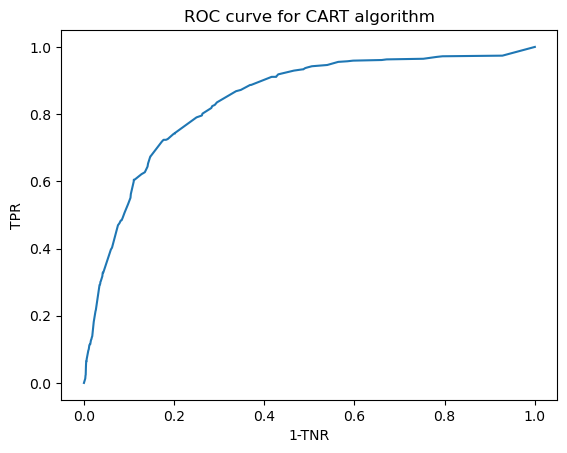

In [63]:
roc_cart = roc_curve(dbt_val_label, CART.predict(dbt_val))
plt.plot(roc_cart[0], roc_cart[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curve for CART algorithm")

In [64]:
auc_cart = roc_auc_score(dbt_val_label, CART.predict(dbt_val))
auc_cart

0.8413999053461434

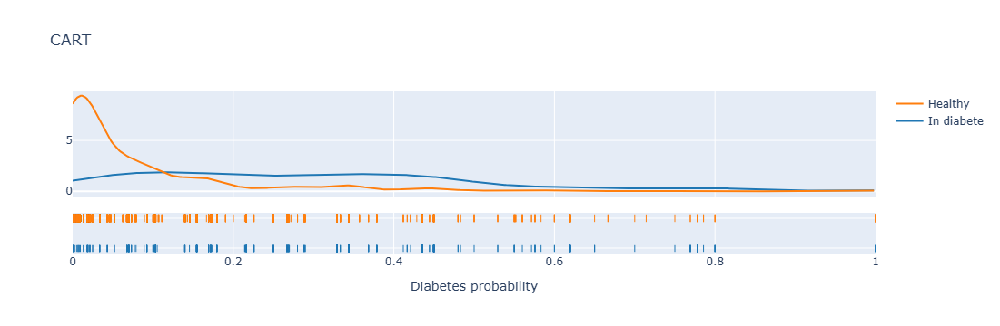

In [65]:
cart_dnp = pd.DataFrame(dict(diabetes = dbt_val_label, cart_pred = CART.predict(dbt_val)))
cart_dnp['diabetes'] = cart_dnp['diabetes'].astype('category')
fig = ff.create_distplot([cart_dnp[cart_dnp.diabetes == 1]['cart_pred'], cart_dnp[cart_dnp.diabetes == 0]['cart_pred']], 
                   show_hist=False, group_labels=['In diabete', 'Healthy'])  # specify the range of the plot
fig.update_xaxes(title_text='Diabetes probability', range=[0, 1])
fig.update_layout(title_text = "CART")

D:\Anacoda\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



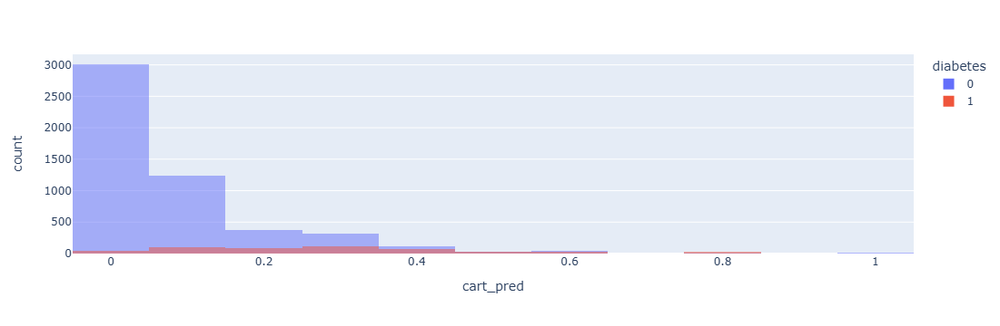

In [66]:
px.histogram(cart_dnp, x='cart_pred', color='diabetes', 
             nbins=20, opacity=0.5, 
             barmode='overlay')

In [67]:
impurity_importance_cart = pd.DataFrame({
    'variable': dbt_train.columns,
    'importance': CART.feature_importances_
}).sort_values('importance')
impurity_importance_cart

,variable,importance
1,smoker,0.004601
8,cancer,0.008860
7,heart_condition,0.010644
2,sex,0.018524
3,coronary_heart_disease,0.032053
5,height,0.065378
4,weight,0.130250
0,age,0.195611
9,family_history_diabetes,0.199335
6,hypertension,0.334741


In [68]:
permutation_importance_cart = pd.DataFrame({
    'variable': dbt_train.columns,
    'importance': permutation_importance(CART, dbt_train, dbt_train_label, n_repeats = 10, random_state = 0).importances_mean
}).sort_values('importance')
permutation_importance_cart

,variable,importance
1,smoker,0.002796
8,cancer,0.007784
7,heart_condition,0.009094
2,sex,0.034003
3,coronary_heart_disease,0.040121
5,height,0.086865
6,hypertension,0.157429
9,family_history_diabetes,0.173962
4,weight,0.175758
0,age,0.244656


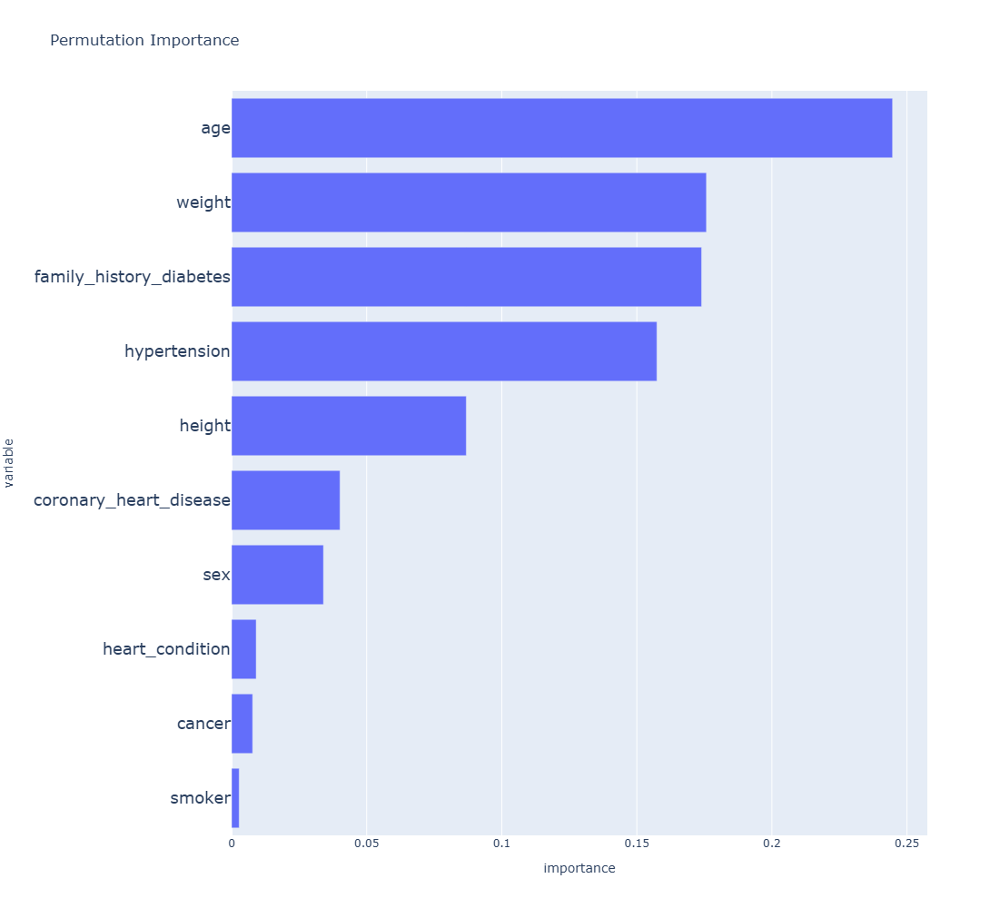

In [123]:
px.bar(permutation_importance_cart, y='variable', x='importance', orientation='h', title='Permutation Importance',height=1000).update_yaxes(tickfont=dict(size=18))

Text(0.5, 1.0, 'ROC curves for CART algorithm in bootstrap')

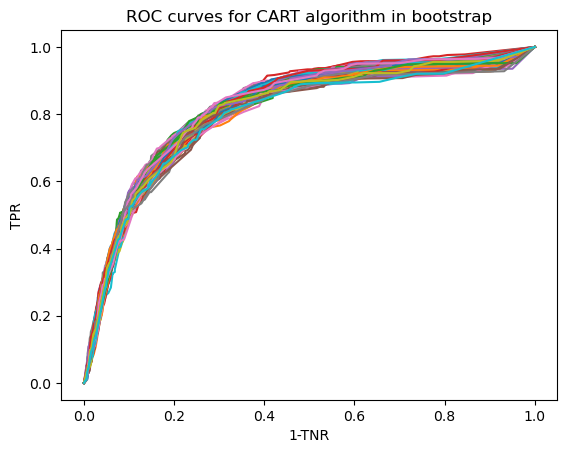

In [70]:
CART_bost = [DecisionTreeRegressor(max_depth=depth,min_samples_split = min_sam).fit(dbt_train_bost[i],dbt_train_bost_label[i]) for i in range(100)]
CART_bost_pred = [model.predict(dbt_val) for model in CART_bost]
for i in range(100):
    roc_cart_bost = roc_curve(dbt_val_label, CART_bost_pred[i])
    plt.plot(roc_cart_bost[0], roc_cart_bost[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for CART algorithm in bootstrap")

In [71]:
tpr_bost_cart = [metrics.recall_score(dbt_val_label, pred>threshold_cart) for pred in CART_bost_pred]
acc_bost_cart = [metrics.accuracy_score(dbt_val_label, pred>threshold_cart) for pred in CART_bost_pred]
tnr_bost_cart = [metrics.recall_score(dbt_val_label, pred>threshold_cart, pos_label=0) for pred in CART_bost_pred]

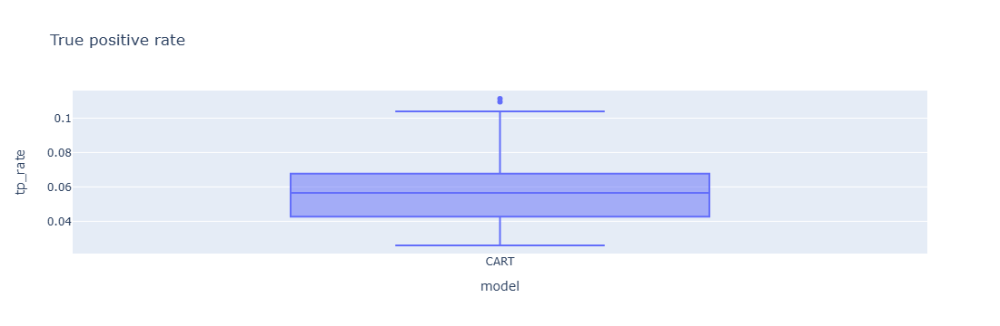

In [72]:
cart_tp_df = pd.DataFrame(dict(tp_rate = tpr_bost_cart ,model = 'CART'))
px.box(pd.concat([cart_tp_df]), x='model', y='tp_rate', title='True positive rate')

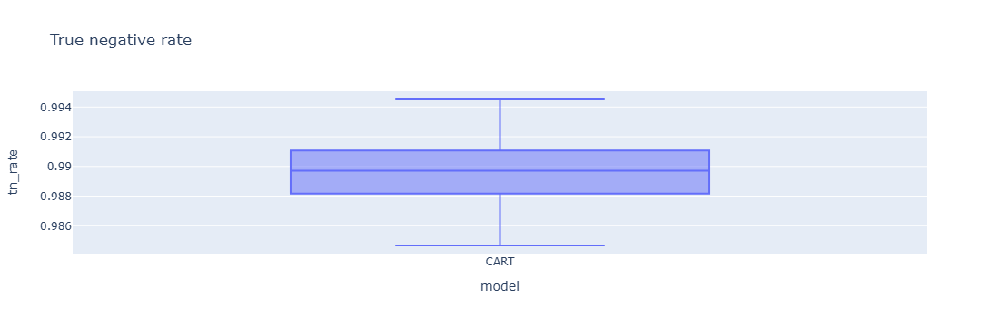

In [73]:
cart_tn_df = pd.DataFrame(dict(tn_rate = tnr_bost_cart ,model = 'CART'))
px.box(pd.concat([cart_tn_df]), x='model', y='tn_rate', title='True negative rate')

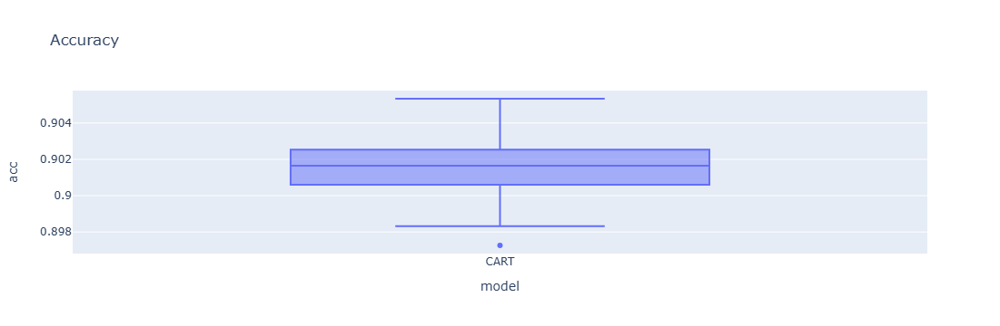

In [74]:
cart_acc_df = pd.DataFrame(dict(acc = acc_bost_cart, model = 'CART'))
px.box(pd.concat([cart_acc_df]), x='model', y='acc', title='Accuracy')

Text(0.5, 1.0, 'ROC curves for CART algorithm in perturbations')

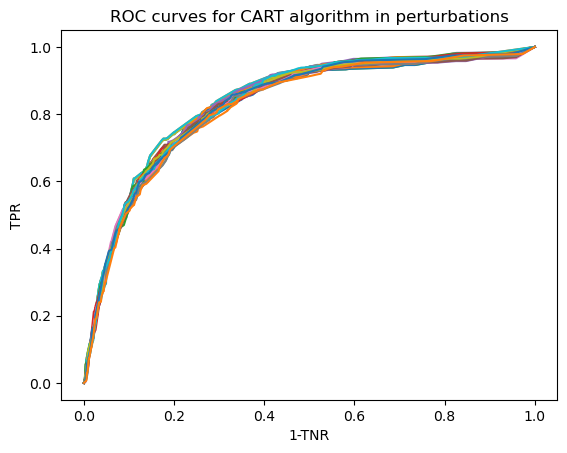

In [75]:
CART_ptb = []

for i in range(32):
    CART_ptb_i = DecisionTreeRegressor(max_depth=depth,min_samples_split = min_sam).fit(dbt_train_ptb[i],dbt_train_ptb_label[i])
    CART_ptb_probs = CART_ptb_i.predict(dbt_val_ptb[i])

    CART_ptb.append([CART_ptb_i, CART_ptb_probs])
    
for i in range(32):
    roc_cart_ptb = roc_curve(dbt_val_ptb_label[i], CART_ptb[i][1])
    plt.plot(roc_cart_ptb[0], roc_cart_ptb[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for CART algorithm in perturbations")

In [76]:
tpr_ptb_cart = [metrics.recall_score(dbt_val_ptb_label[i], CART_ptb[i][1]>threshold_cart) for i in range(32)]
acc_ptb_cart = [metrics.accuracy_score(dbt_val_ptb_label[i], CART_ptb[i][1]>threshold_cart) for i in range(32)]
tnr_ptb_cart = [metrics.recall_score(dbt_val_ptb_label[i], CART_ptb[i][1]>threshold_cart, pos_label=0) for i in range(32)]

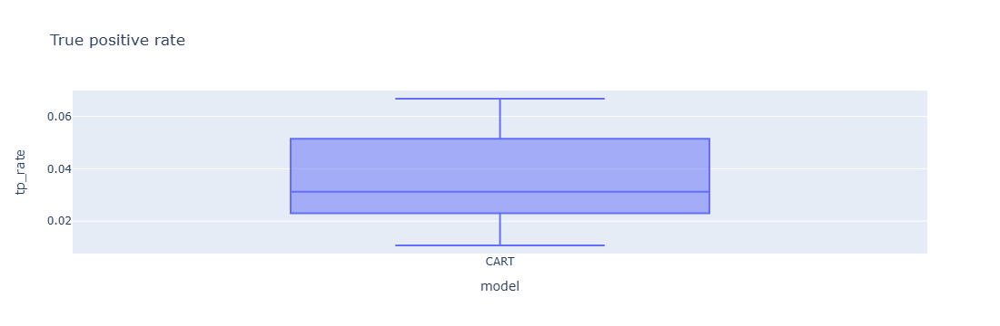

In [77]:
cart_tp_ptb = pd.DataFrame(dict(tp_rate = tpr_ptb_cart ,model = 'CART'))
px.box(pd.concat([cart_tp_ptb]), x='model', y='tp_rate', title='True positive rate')

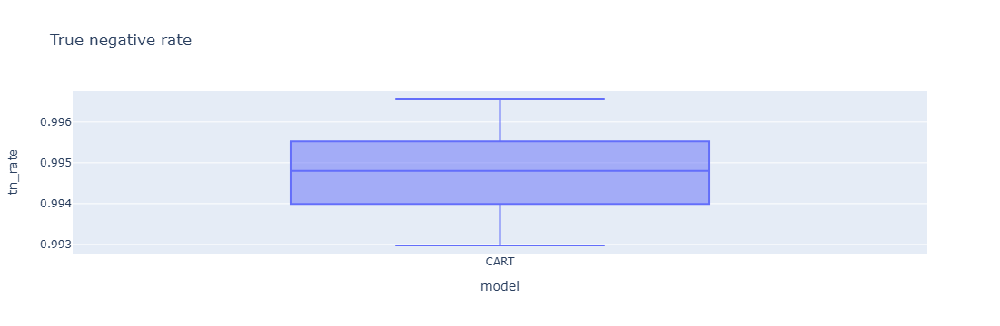

In [78]:
cart_tn_ptb = pd.DataFrame(dict(tn_rate = tnr_ptb_cart ,model = 'CART'))
px.box(pd.concat([cart_tn_ptb]), x='model', y='tn_rate', title='True negative rate')

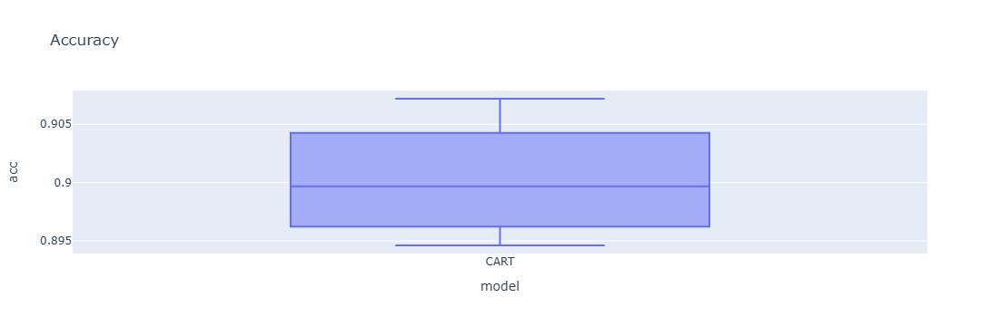

In [79]:
cart_acc_ptb = pd.DataFrame(dict(acc = acc_ptb_cart, model = 'CART'))
px.box(pd.concat([cart_acc_ptb]), x='model', y='acc', title='Accuracy')

*************************************************************************************************************************************************

The following parts are for the RF algorithm.

*************************************************************************************************************************************************

In [80]:
threshold_rf = 0
acc = 0
best_comb_rf = []

for j in [50,100,150]:
    for k in [None, 4,8]:
        for l in [1,2,3,5,8]:
            RF = RandomForestRegressor(n_estimators= j, max_depth=k, max_features=l).fit(dbt_train, dbt_train_label)
            for i in [float(i)/100 for i in range(0,101)]:
                if accuracy_score(dbt_val_label, RF.predict(dbt_val) > i) > acc:
                    acc = accuracy_score(dbt_val_label, RF.predict(dbt_val) > i)
                    threshold_rf = i
                    best_comb_rf = [j,k,l]

In [81]:
rf_est = best_comb_rf[0]
rf_depth = best_comb_rf[1]
rf_fea = best_comb_rf[2]

RF = RandomForestRegressor(n_estimators= rf_est, max_depth=rf_depth, max_features= rf_fea)
RF.fit(dbt_train, dbt_train_label)

RandomForestRegressor(max_depth=4, max_features=5)

In [82]:
acc_rf = accuracy_score(dbt_val_label, RF.predict(dbt_val) > threshold_rf)
acc_rf

0.9085001756234633

In [83]:
rmse_rf = np.sqrt(np.mean((dbt_val_label - (RF.predict(dbt_val) > threshold_rf))**2))
rmse_rf

0.302489378948314

In [84]:
cfm_rf = confusion_matrix(dbt_val_label, RF.predict(dbt_val) > threshold_rf)
cfm_rf

array([[5077,   78],
       [ 443,   96]], dtype=int64)

In [85]:
tpr_rf = cfm_rf[1,1]/(cfm_rf[1,0]+cfm_rf[1,1])
tnr_rf = cfm_rf[0,0]/(cfm_rf[0,0]+cfm_rf[0,1])
tpr_rf, tnr_rf

(0.17810760667903525, 0.9848690591658584)

Text(0.5, 1.0, 'ROC curve for RF algorithm')

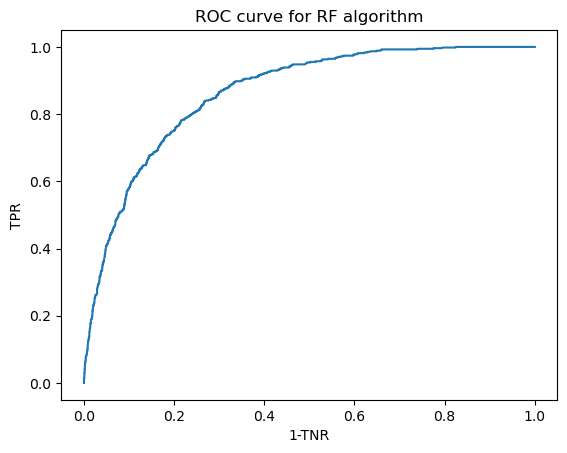

In [86]:
roc_rf = roc_curve(dbt_val_label, RF.predict(dbt_val))
plt.plot(roc_rf[0], roc_rf[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curve for RF algorithm")

In [87]:
auc_rf = roc_auc_score(dbt_val_label, RF.predict(dbt_val))
auc_rf

0.863413405217479

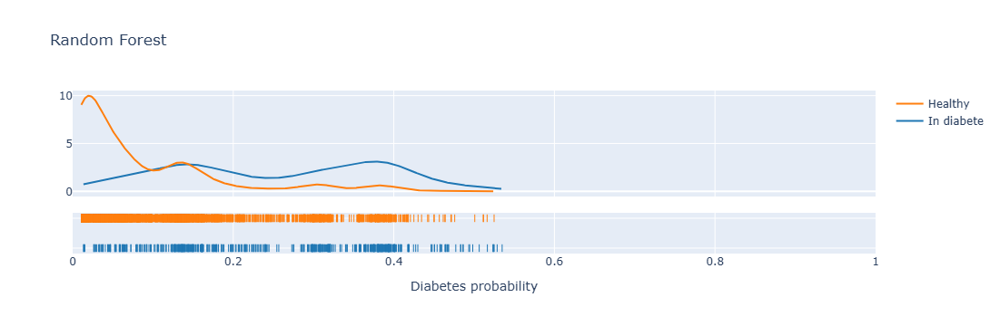

In [88]:
rf_dnp = pd.DataFrame(dict(diabetes = dbt_val_label, rf_pred = RF.predict(dbt_val)))
rf_dnp['diabetes'] = rf_dnp['diabetes'].astype('category')
fig = ff.create_distplot([rf_dnp[rf_dnp.diabetes == 1]['rf_pred'], rf_dnp[rf_dnp.diabetes == 0]['rf_pred']], 
                   show_hist=False, group_labels=['In diabete', 'Healthy'])  # specify the range of the plot
fig.update_xaxes(title_text='Diabetes probability', range=[0, 1])
fig.update_layout(title_text = "Random Forest")

D:\Anacoda\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



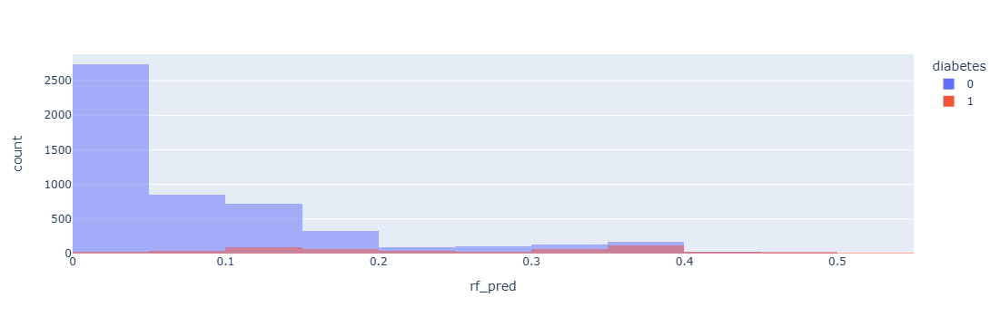

In [89]:
px.histogram(rf_dnp, x='rf_pred', color='diabetes', 
             nbins=20, opacity=0.5, 
             barmode='overlay')

In [90]:
impurity_importance_rf = pd.DataFrame({
    'variable': dbt_train.columns,
    'importance': RF.feature_importances_
}).sort_values('importance')
impurity_importance_rf

,variable,importance
2,sex,0.000399
1,smoker,0.000641
8,cancer,0.002636
5,height,0.004794
7,heart_condition,0.006779
3,coronary_heart_disease,0.046157
4,weight,0.071904
0,age,0.161480
9,family_history_diabetes,0.287973
6,hypertension,0.417236


In [91]:
permutation_importance_rf = pd.DataFrame({
    'variable': dbt_train.columns,
    'importance': permutation_importance(RF, dbt_train, dbt_train_label, n_repeats = 10, random_state = 0).importances_mean
}).sort_values('importance')
permutation_importance_rf

,variable,importance
2,sex,0.000002
1,smoker,0.000090
8,cancer,0.000442
5,height,0.000609
7,heart_condition,0.001370
3,coronary_heart_disease,0.010057
4,weight,0.020159
0,age,0.048585
9,family_history_diabetes,0.098480
6,hypertension,0.099780


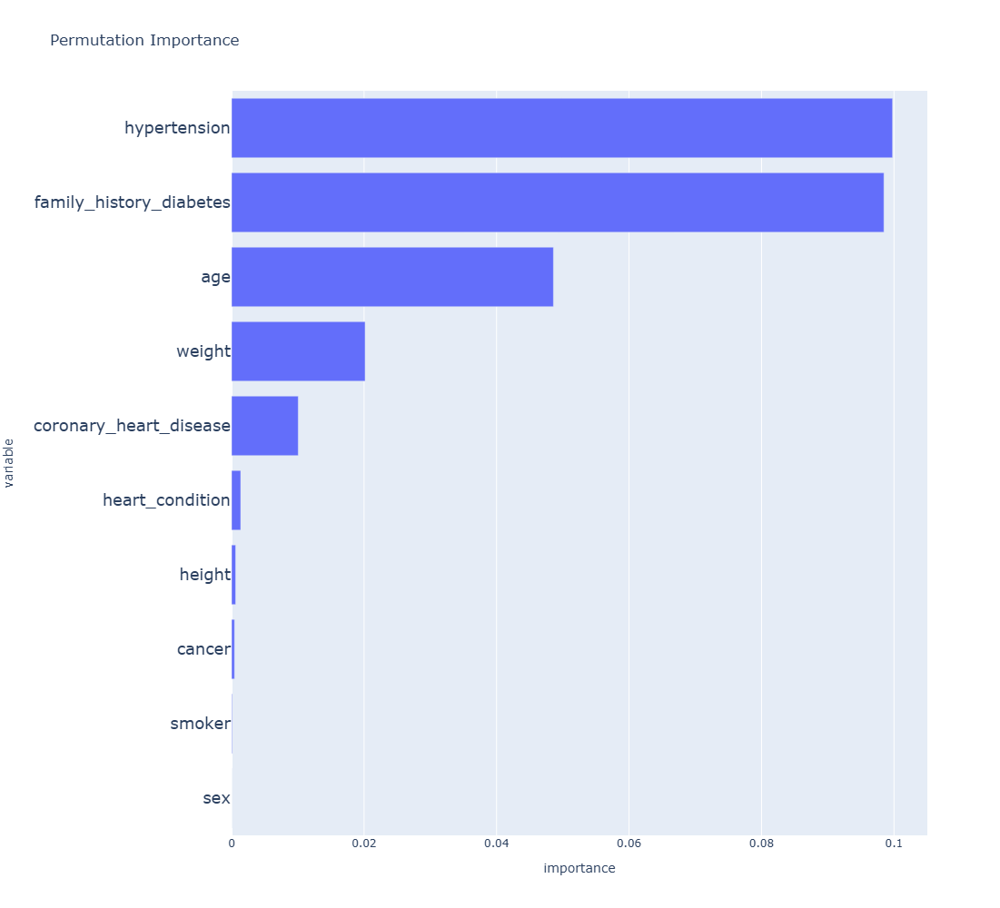

In [124]:
px.bar(permutation_importance_rf, y='variable', x='importance', orientation='h', title='Permutation Importance',height=1000).update_yaxes(tickfont=dict(size=18))

Text(0.5, 1.0, 'ROC curves for RF algorithm in bootstrap')

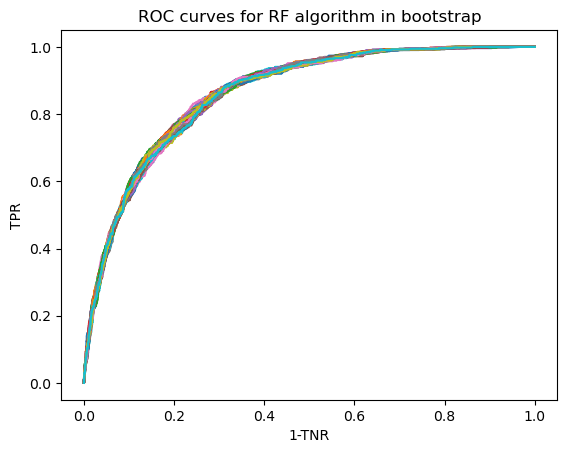

In [93]:
RF_bost = [RandomForestRegressor(n_estimators= rf_est, max_depth=rf_depth, max_features= rf_fea).fit(dbt_train_bost[i],dbt_train_bost_label[i]) for i in range(100)]
RF_bost_pred = [model.predict(dbt_val) for model in RF_bost]
for i in range(100):
    roc_rf_bost = roc_curve(dbt_val_label, RF_bost_pred[i])
    plt.plot(roc_rf_bost[0], roc_rf_bost[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for RF algorithm in bootstrap")

In [94]:
tpr_bost_rf = [metrics.recall_score(dbt_val_label, pred>threshold_rf) for pred in RF_bost_pred]
acc_bost_rf = [metrics.accuracy_score(dbt_val_label, pred>threshold_rf) for pred in RF_bost_pred]
tnr_bost_rf = [metrics.recall_score(dbt_val_label, pred>threshold_rf, pos_label=0) for pred in RF_bost_pred]

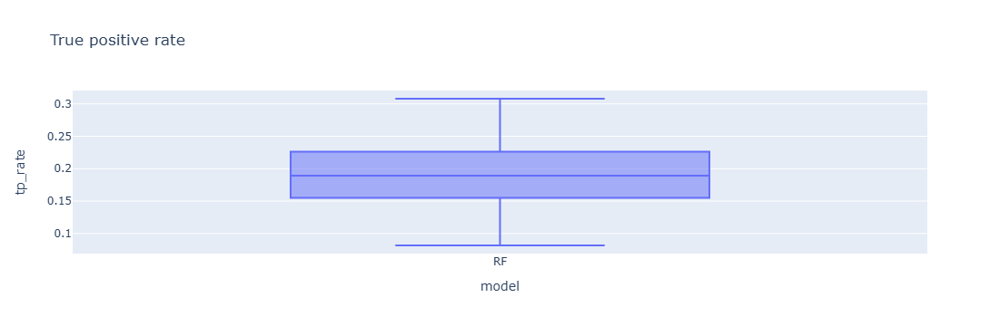

In [95]:
rf_tp_df = pd.DataFrame(dict(tp_rate = tpr_bost_rf ,model = 'RF'))
px.box(pd.concat([rf_tp_df]), x='model', y='tp_rate', title='True positive rate')

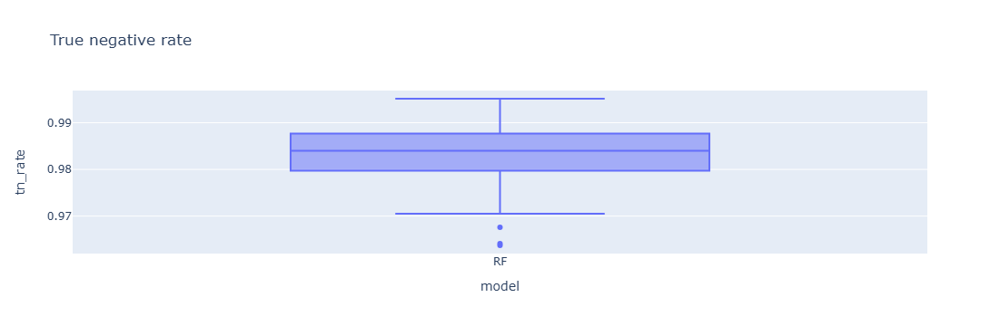

In [96]:
rf_tn_df = pd.DataFrame(dict(tn_rate = tnr_bost_rf ,model = 'RF'))
px.box(pd.concat([rf_tn_df]), x='model', y='tn_rate', title='True negative rate')

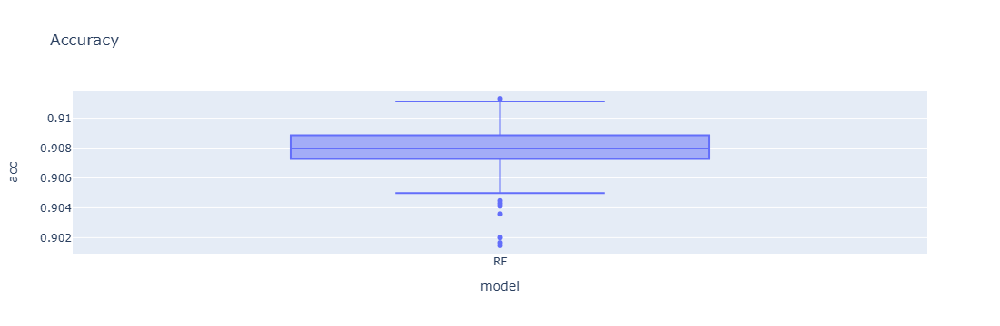

In [97]:
rf_acc_df = pd.DataFrame(dict(acc = acc_bost_rf, model = 'RF'))
px.box(pd.concat([rf_acc_df]), x='model', y='acc', title='Accuracy')

Text(0.5, 1.0, 'ROC curves for RF algorithm in perturbations')

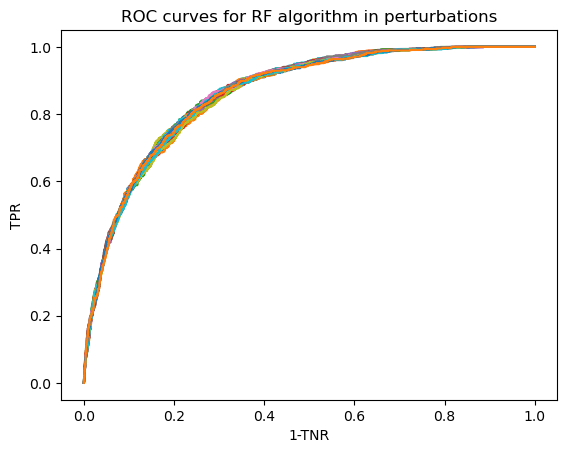

In [98]:
RF_ptb = []

for i in range(32):
    RF_ptb_i = RandomForestRegressor(n_estimators= rf_est, max_depth=rf_depth, max_features= rf_fea).fit(dbt_train_ptb[i],dbt_train_ptb_label[i])
    RF_ptb_probs = RF_ptb_i.predict(dbt_val_ptb[i])

    RF_ptb.append([RF_ptb_i, RF_ptb_probs])
    
for i in range(32):
    roc_rf_ptb = roc_curve(dbt_val_ptb_label[i], RF_ptb[i][1])
    plt.plot(roc_rf_ptb[0], roc_rf_ptb[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves for RF algorithm in perturbations")

In [99]:
tpr_ptb_rf = [metrics.recall_score(dbt_val_ptb_label[i], RF_ptb[i][1]>threshold_rf) for i in range(32)]
acc_ptb_rf = [metrics.accuracy_score(dbt_val_ptb_label[i], RF_ptb[i][1]>threshold_rf) for i in range(32)]
tnr_ptb_rf = [metrics.recall_score(dbt_val_ptb_label[i], RF_ptb[i][1]>threshold_rf, pos_label=0) for i in range(32)]

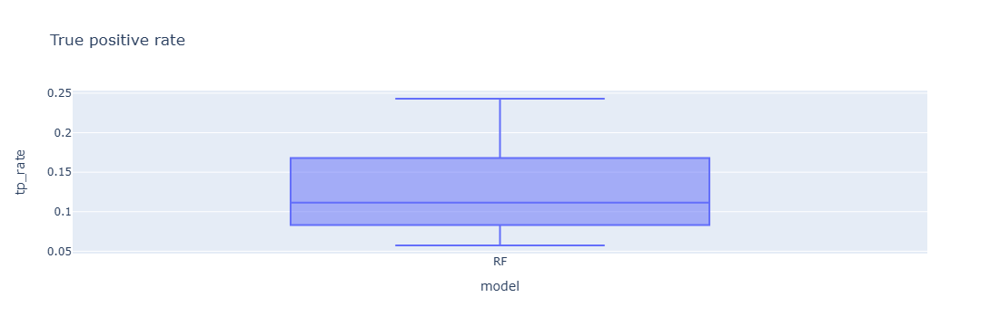

In [100]:
rf_tp_ptb = pd.DataFrame(dict(tp_rate = tpr_ptb_rf ,model = 'RF'))
px.box(pd.concat([rf_tp_ptb]), x='model', y='tp_rate', title='True positive rate')

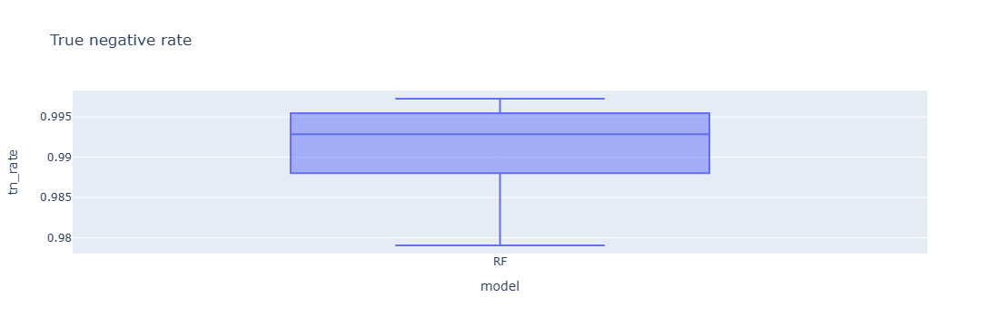

In [101]:
rf_tn_ptb = pd.DataFrame(dict(tn_rate = tnr_ptb_rf ,model = 'RF'))
px.box(pd.concat([rf_tn_ptb]), x='model', y='tn_rate', title='True negative rate')

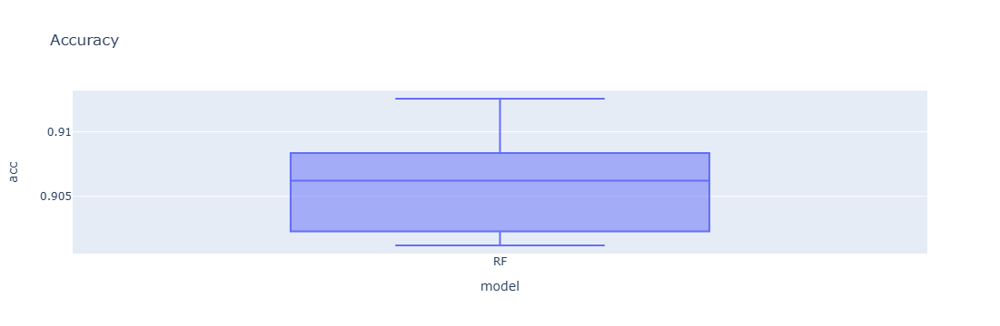

In [102]:
rf_acc_ptb = pd.DataFrame(dict(acc = acc_ptb_rf, model = 'RF'))
px.box(pd.concat([rf_acc_ptb]), x='model', y='acc', title='Accuracy')

The following parts are about the result comparasion.

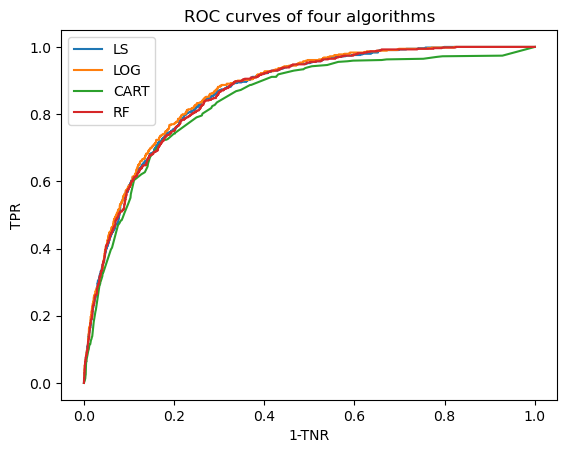

In [103]:
plt.plot(roc_ls[0], roc_ls[1])
plt.plot(roc_log[0], roc_log[1])
plt.plot(roc_cart[0], roc_cart[1])
plt.plot(roc_rf[0], roc_rf[1])
plt.xlabel("1-TNR")
plt.ylabel("TPR")
plt.title("ROC curves of four algorithms")
plt.legend(["LS","LOG","CART","RF"])

In [104]:
res_com = pd.DataFrame([[acc_ls, rmse_ls, tpr_ls, tnr_ls, auc_ls],
                        [acc_log, rmse_log, tpr_log, tnr_log, auc_log],
                        [acc_cart, rmse_cart, tpr_cart, tnr_cart, auc_cart],
                        [acc_rf, rmse_rf, tpr_rf, tnr_rf, auc_rf]], index = ["LS","LOG","CART","RF"],
                      columns = ["Accuracy", "rMSE", "True Positive Rate", "True Negative Rate" , "AUC"])
res_com

,Accuracy,rMSE,True Positive Rate,True Negative Rate,AUC
LS,0.909378,0.301034,0.142857,0.989525,0.864926
LOG,0.909905,0.300158,0.153989,0.988943,0.869450
CART,0.906744,0.305379,0.063080,0.994956,0.841400
RF,0.908500,0.302489,0.178108,0.984869,0.863413


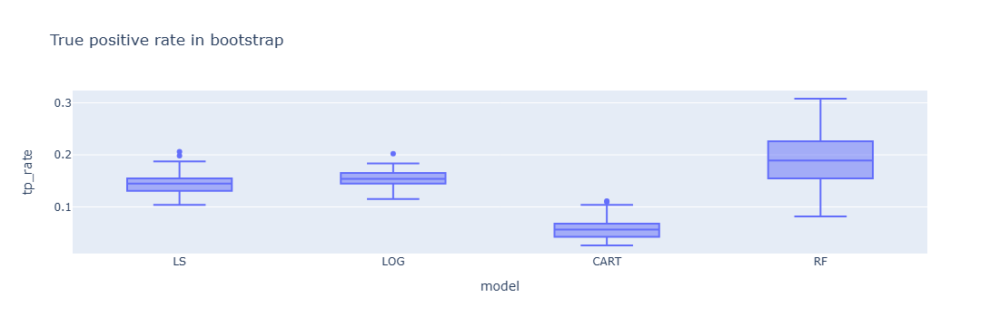

In [105]:
px.box(pd.concat([ls_tp_df,log_tp_df,cart_tp_df,rf_tp_df]), x='model', y='tp_rate', title='True positive rate in bootstrap')

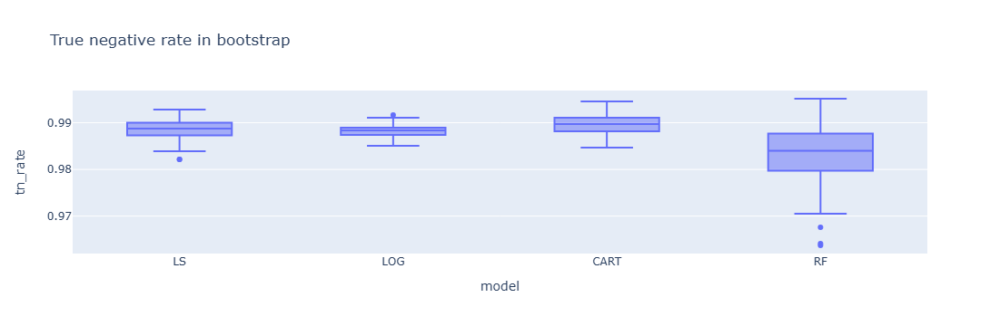

In [106]:
px.box(pd.concat([ls_tn_df,log_tn_df,cart_tn_df,rf_tn_df]), x='model', y='tn_rate', title='True negative rate in bootstrap')

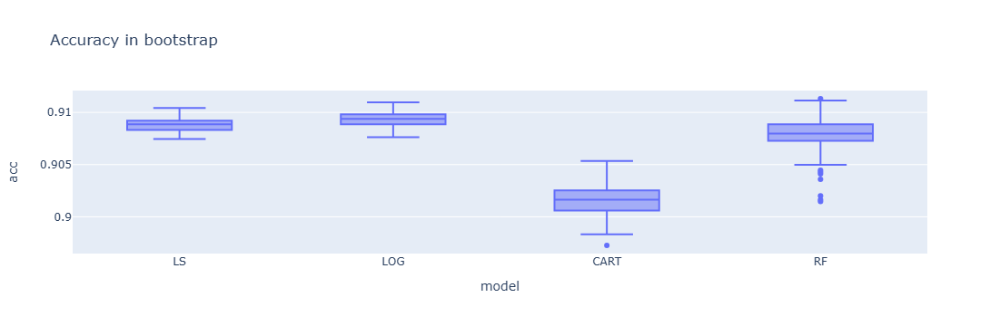

In [107]:
px.box(pd.concat([ls_acc_df,log_acc_df,cart_acc_df,rf_acc_df]), x='model', y='acc', title='Accuracy in bootstrap')

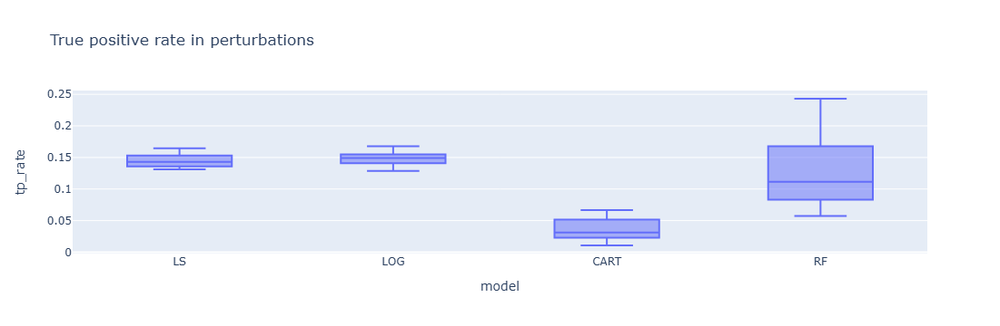

In [108]:
px.box(pd.concat([ls_tp_ptb,log_tp_ptb,cart_tp_ptb,rf_tp_ptb]), x='model', y='tp_rate', title='True positive rate in perturbations')

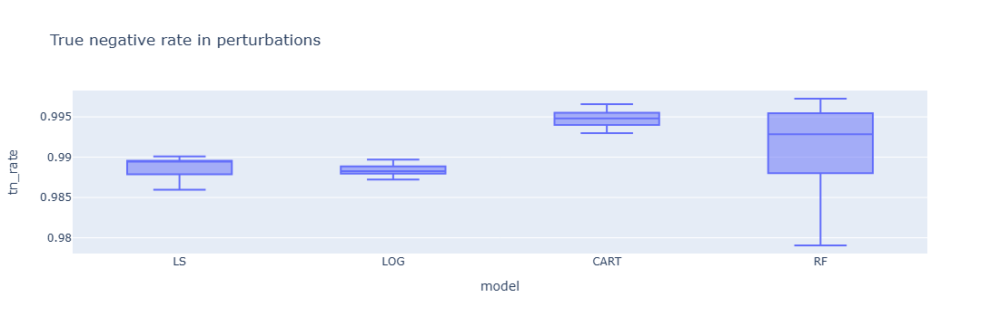

In [109]:
px.box(pd.concat([ls_tn_ptb,log_tn_ptb,cart_tn_ptb,rf_tn_ptb]), x='model', y='tn_rate', title='True negative rate in perturbations')

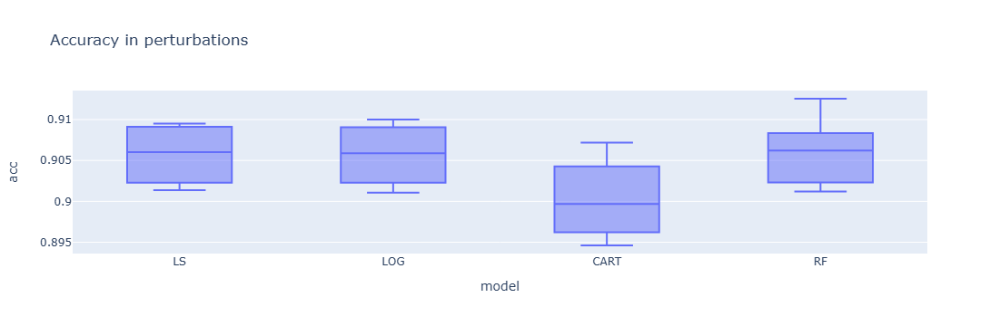

In [110]:
px.box(pd.concat([ls_acc_ptb,log_acc_ptb,cart_acc_ptb,rf_acc_ptb]), x='model', y='acc', title='Accuracy in perturbations')

*************************************************************************************************************************************************

The following parts are for the Ensemble algorithm.

*************************************************************************************************************************************************

In [111]:
LS_em = [LS_ptb[i][0] for i in range(32)]
LOG_em = [LOG_ptb[i][0] for i in range(32)]
CART_em = [CART_ptb[i][0] for i in range(32)]
RF_em = [RF_ptb[i][0] for i in range(32)]

In [112]:
LS_em_pred = []
LOG_em_pred = []
CART_em_pred = []
RF_em_pred = []

for i in range(32):
    LS_em_pred.append(LS_em[i].predict(dbt_val_ptb[i]))
    LOG_em_pred.append(LOG_em[i].predict_proba(dbt_val_ptb[i])[:,1])
    CART_em_pred.append(CART_em[i].predict(dbt_val_ptb[i]))
    RF_em_pred.append(RF_em[i].predict(dbt_val_ptb[i]))

In [113]:
alg_com = []

for i in range(32):
    alg_com.append(["Data version " + str(i), "LS", metrics.accuracy_score(dbt_val_ptb_label[i], LS_em_pred[i] >threshold_ls),
                    metrics.recall_score(dbt_val_ptb_label[i], LS_em_pred[i] >threshold_ls),
                    metrics.recall_score(dbt_val_ptb_label[i], LS_em_pred[i] >threshold_ls, pos_label=0),
                    roc_auc_score(dbt_val_ptb_label[i], LS_em_pred[i])])
    alg_com.append(["Data version " + str(i), "LOG", metrics.accuracy_score(dbt_val_ptb_label[i], LOG_em[i].predict(dbt_val_ptb[i])),
                    metrics.recall_score(dbt_val_ptb_label[i], LOG_em[i].predict(dbt_val_ptb[i])),
                    metrics.recall_score(dbt_val_ptb_label[i], LOG_em[i].predict(dbt_val_ptb[i]), pos_label=0),
                    roc_auc_score(dbt_val_ptb_label[i], LOG_em_pred[i])])
    alg_com.append(["Data version " + str(i), "CART", metrics.accuracy_score(dbt_val_ptb_label[i], CART_em_pred[i] >threshold_cart),
                    metrics.recall_score(dbt_val_ptb_label[i], CART_em_pred[i] >threshold_cart),
                    metrics.recall_score(dbt_val_ptb_label[i], CART_em_pred[i] >threshold_cart, pos_label=0),
                    roc_auc_score(dbt_val_ptb_label[i], CART_em_pred[i])])
    alg_com.append(["Data version " + str(i), "RF", metrics.accuracy_score(dbt_val_ptb_label[i], RF_em_pred[i] >threshold_rf),
                    metrics.recall_score(dbt_val_ptb_label[i], RF_em_pred[i] >threshold_rf),
                    metrics.recall_score(dbt_val_ptb_label[i], RF_em_pred[i] >threshold_rf, pos_label=0),
                    roc_auc_score(dbt_val_ptb_label[i], RF_em_pred[i])])

In [114]:
pd.set_option('display.max_rows', None)

pd.DataFrame(alg_com, columns = ["Dataversion", "Algorithm", "Accuracy", "True positive rate", "True negative rate", "AUC"])

,Dataversion,Algorithm,Accuracy,True positive rate,True negative rate,AUC
0,Data version 0,LS,0.909378,0.142857,0.989525,0.864926
1,Data version 0,LOG,0.909905,0.153989,0.988943,0.869450
2,Data version 0,CART,0.906744,0.063080,0.994956,0.841176
3,Data version 0,RF,0.909378,0.243043,0.979049,0.863303
4,Data version 1,LS,0.909378,0.142857,0.989525,0.864932
5,Data version 1,LOG,0.909203,0.155844,0.987973,0.869485
6,Data version 1,CART,0.906920,0.066790,0.994762,0.843287
7,Data version 1,RF,0.908325,0.220779,0.980213,0.862431
8,Data version 2,LS,0.909378,0.142857,0.989525,0.864797
9,Data version 2,LOG,0.907798,0.141002,0.987973,0.869476


In [115]:
pd.set_option('display.max_rows', 20)

fit_com = pd.DataFrame(alg_com, columns = ["Dataversion", "Algorithm", "Accuracy", "True positive rate", "True negative rate", "AUC"])

best_id = 0
best_sum = 0
for i in range(128):
    vsum = fit_com.iloc[i][5]
    if vsum > best_sum:
        best_sum = vsum
        best_id = i

b_model = None
threshold = 0
b_name = None
if best_id%4 == 0:
    b_model = LS_em[best_id//4]
    threshold = threshold_ls
    b_name = "LS"
if best_id%4 == 1:
    b_model = LOG_em[best_id//4]
    b_name = "LOG"
if best_id%4 == 2:
    b_model = CART_em[best_id//4]
    threshold = threshold_cart
    b_name = "CART"
if best_id%4 == 3:
    b_model = RF_em[best_id//4]
    threshold = threshold_rf
    b_name = "RF"

if best_id%4 == 1:
    Best = [["Test set corresponding version", b_name, metrics.accuracy_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4])),
                        metrics.recall_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4])),
                        metrics.recall_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4]), pos_label=0),
                        roc_auc_score(dbt_test_ptb_label[best_id//4], b_model.predict_proba(dbt_test_ptb[best_id//4])[:,1])]]
else:
    Best = [["Test set corresponding version", b_name, metrics.accuracy_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4]) > threshold),
                        metrics.recall_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4]) > threshold),
                        metrics.recall_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4]) > threshold, pos_label=0),
                        roc_auc_score(dbt_test_ptb_label[best_id//4], b_model.predict(dbt_test_ptb[best_id//4]))]]
pd.DataFrame(Best, columns = ["Dataversion", "Algorithm", "Accuracy", "True positive rate", "True negative rate", "AUC"])

C:\Windows\Temp\ipykernel_33964\3777676170.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



,Dataversion,Algorithm,Accuracy,True positive rate,True negative rate,AUC
0,Test set corresponding version,LOG,0.902443,0.149047,0.98748,0.844643


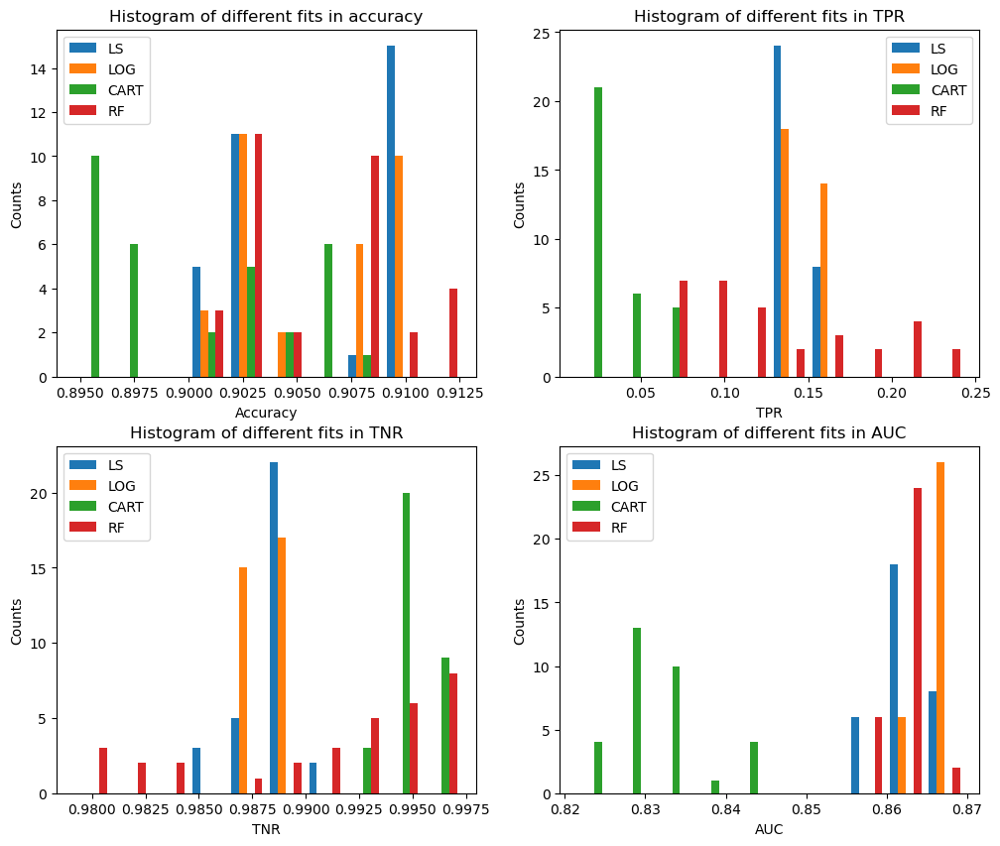

In [116]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

axs[0, 0].hist([[alg_com[4*j+i][2] for j in range(32)] for i in range(4)])
axs[0, 0].set_xlabel("Accuracy")
axs[0, 0].set_ylabel("Counts")
axs[0, 0].set_title("Histogram of different fits in accuracy")
axs[0, 0].legend(["LS","LOG","CART","RF"])

axs[0, 1].hist([[alg_com[4*j+i][3] for j in range(32)] for i in range(4)])
axs[0, 1].set_xlabel("TPR")
axs[0, 1].set_ylabel("Counts")
axs[0, 1].set_title("Histogram of different fits in TPR")
axs[0, 1].legend(["LS","LOG","CART","RF"])

axs[1, 0].hist([[alg_com[4*j+i][4] for j in range(32)] for i in range(4)])
axs[1, 0].set_xlabel("TNR")
axs[1, 0].set_ylabel("Counts")
axs[1, 0].set_title("Histogram of different fits in TNR")
axs[1, 0].legend(["LS","LOG","CART","RF"])

axs[1, 1].hist([[alg_com[4*j+i][5] for j in range(32)] for i in range(4)])
axs[1, 1].set_xlabel("AUC")
axs[1, 1].set_ylabel("Counts")
axs[1, 1].set_title("Histogram of different fits in AUC")
axs[1, 1].legend(["LS","LOG","CART","RF"])

In [117]:
best_algs_auc = fit_com["AUC"].quantile(0.75)

In [118]:
em_prob = []
em_preds = []

for i in range(128):
    if alg_com[i][5] >= best_algs_auc:
        if i%4 == 0:
            em_prob.append(LS_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]))
            em_preds.append((LS_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]) > threshold_ls).astype(int))
        if i%4 == 1:
            em_prob.append(LOG_em[i//4].predict_proba(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)])[:,1])
            em_preds.append(LOG_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]))
        if i%4 == 2:
            em_prob.append(CART_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]))
            em_preds.append((CART_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]) > threshold_cart).astype(int))
        if i%4 == 3:
            em_prob.append(RF_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]))
            em_preds.append((RF_em[i//4].predict(dbt_test_ptb[i//4][dbt_test_ptb[i//4].index.isin(dbt_test_ptb[0].index)]) > threshold_rf).astype(int))

em_prob_matrix = np.vstack(em_prob).T
em_pb = em_prob_matrix.mean(axis=1)
em_pred_matrix = np.vstack(em_preds).T
em_res = em_pred_matrix.sum(axis=1) >= 16


In [119]:
em_inf = [["Test set corresponding version", "Ensemble", metrics.accuracy_score(dbt_test_ptb_label[0], em_res),
                    metrics.recall_score(dbt_test_ptb_label[0], em_res),
                    metrics.recall_score(dbt_test_ptb_label[0], em_res, pos_label=0),
                    roc_auc_score(dbt_test_ptb_label[0], em_pb)]]
pd.DataFrame(em_inf, columns = ["Dataversion", "Algorithm", "Accuracy", "True positive rate", "True negative rate", "AUC"])

,Dataversion,Algorithm,Accuracy,True positive rate,True negative rate,AUC
0,Test set corresponding version,Ensemble,0.902937,0.149306,0.987869,0.844543
